# Image Colorization using Conditional Generative Adversarial Networks (GANs)

The purpose of this Jupyter Notebook is to train a Unet generator network in a Conditional GAN framework in order to colorize grayscale images. In this notebook the Conditional GAN network will be composed by a standard Unet generator and a Patch Discriminator and we are going to implement our vanilla solution. All the details about the dataset, models, training strategies and losses used in this implementation will ge biven along the notebook. 

In [ ]:
#PACKAGES IMPORT

import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt                      
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.transforms import Compose, ToTensor
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader

from fastai.data.external import untar_data,URLs
from fastai.data.transforms import get_image_files

import PIL

#DEVICE SELECTION
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

##DATASET CREATION

For this task we decided to use the COCO SAMPLE dataset. This dataset is easy to retrieve by using FastAI facilities. After downloading it we split it into training and test set, we wrote the CustomDataset class and we define the training and test dataloaders. For this task our generator network has to colorize the images so, starting from a simple image of the dataset we convert it to the Lab color space, so the generatoro will have in input the L layer of every image (the L layer defines the intensity layer) and has to predict the ab layers (that defines the colors of the image). We provide this split already in the CustomDataset, so the train and test dataloaders can return Lab images in a fast and clear way. 

In [ ]:
#COCO SAMPLE Dataset download
path = untar_data(URLs.COCO_SAMPLE) 
coco_path = str(path) + "/train_sample" 

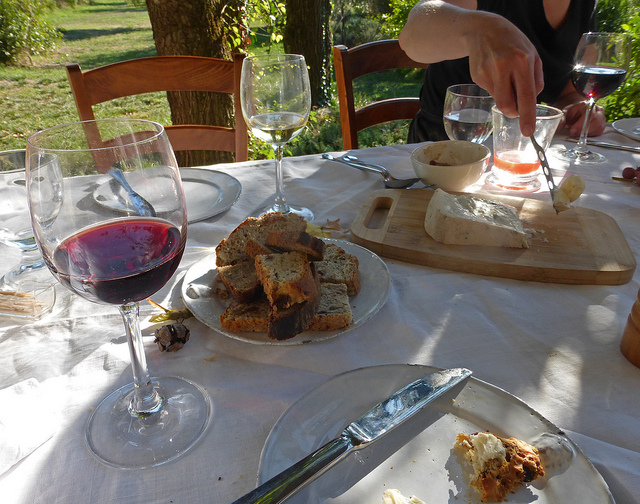

In [ ]:
#try to open a single image in the dataset 
dataset = get_image_files(coco_path)   
img = PIL.Image.open(dataset[1])
img

In [ ]:
#Retrieve some info
print("INFO DATASET:")
print("Dataset length: ", len(dataset))
print("Images dimensions: ", img.size)

INFO DATASET:
Dataset length:  21837
Images dimensions:  (640, 504)


In [ ]:
#define the train and test dataset split 

paths = glob.glob(coco_path+"/*.jpg")                                # paths is a list with all the image files names of the COCO dataset
np.random.seed(123)                                                  # Seeding for reproducible results
paths_subset = np.random.choice(paths, 20000, replace=False)         # Randomly choosing 20,000 images (image file names) from the list
rand_idxs = np.random.permutation(20000)                             # Shuffling the indexes
train_idxs = rand_idxs[:19900]                                       # Using first 19900 images for training
test_idxs = rand_idxs[19900:]                                        # Using last 100 images for testing
train_paths = paths_subset[train_idxs]                               # Array with all the image files names for the training
test_paths = paths_subset[test_idxs]                                 # Array with all the image files names for the validation
print("Training set length: "+str(len(train_paths)))
print("Test set length: "+str(len(test_paths)))

Training dataset length: 16000
Test dataset length: 4000


In [ ]:
#CustomDataset class creation

#in our task we will consider images that have a SIZE x SIZE dimension. We define a simple constant for this SIZE value
SIZE= 256

class CustomDataset(Dataset):

    '''
    @param paths list of all the dataset images paths
    @param transform transformation that must be applyied to the dataset images
    @param training_mode simple parameter that indicates if this is a training or test set 
    '''
    def __init__(self, paths, transform, training_mode=True):
        self.paths = paths
        self.size = SIZE
        self.training_mode = training_mode

        if training_mode:
          self.transform = transform
        else:
          #simple resize to the SIZE x SIZE dimensions
          self.transform = Compose([
              transforms.Resize((SIZE,SIZE), Image.BICUBIC),
          ])

    '''
    @param index in the paths array of the images that must be returned
    @return the image split into the L and ab layers
    '''
    def __getitem__(self, index):
        #open the image as an RGB image and apply the correct transformations and transform to numpy array
        img = Image.open(self.paths[index]).convert("RGB")
        img = self.transform(img)
        img = np.array(img)

        #converting RGB to L*a*b color space used for the task and then to a tensor
        img_lab = rgb2lab(img).astype("float32")
        img_lab = transforms.ToTensor()(img_lab)

        #normalization of the L and ab layers values
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        
        #return the image split into the L and ab layers
        return {'L': L, 'ab': ab}
        
    '''
    @return the dataset length
    '''
    def __len__(self): 
      return len(self.paths)
 


In [ ]:
#define the train and test datasets and the batch size, the batch size was define in order to fit into the CUDA memory
batch_size = 16

#we define this simple transformation for the training dataset
train_transform = transforms.Compose([
     transforms.Resize((SIZE,SIZE), Image.BICUBIC),
])

#define the train and test datasets and dataloaders
train_dataset =  CustomDataset(train_paths, train_transform, training_mode = True)
test_dataset =  CustomDataset(test_paths, transform = None, training_mode = False)

train_dataloader = DataLoader(train_dataset, batch_size, shuffle=True, num_workers=os.cpu_count())
test_dataloader = DataLoader(test_dataset, batch_size, shuffle=False, num_workers=os.cpu_count())

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(


In [ ]:
#verify that all is correct 
print("Train dataloader next item:")
data = next(iter(train_dataloader))
Ls, abs = data['L'], data['ab']
print(Ls.shape, abs.shape)
print("Train dataloader and test dataloader dimensions:")
print(len(train_dataloader), len(test_dataloader))
print("L layer variable type:")
type(data['L'])

Train dataloader next item:
torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
Train dataloader and test dataloader dimensions:
1000 250
L layer variable type:


torch.Tensor

##GAN NETWORK MODELS DEFINITINON AND INITIALIZATION: UNET AND PATCH DISCRIMINATOR

In this section we define the models that compose our Conditional GAN: we define a Unet generator and a Patch discriminator. The Unet generator is the standard Unet defined here with a tanh activation function in the final layer. This network  has to generate from the L layer of the image the ab layers. We defined also our Patch Discriminator that is defined as a 70 x 70 pixels patch discriminator that indicates for every 70 x 70 pixels patch in a given image if it is a true patch or if it is generated by the Unet. So the Patch Discriminator will receive a fake image (built by concatenating the L layer in input to the generator and the generated ab layers) or a true image. 

We also define a function for initiliazing the networks weights with uniform or xavier criterion. We will use the uniform criterion because the xavier criterion initialize the weights of the discriminator network in a way that makes it too strong after few epochs, so the generator training stalls.  

In [ ]:
import torch
import torch.nn as nn

""" Convolutional block:
    It follows a two 3x3 convolutional layer, each followed by a batch normalization and a relu activation.
"""
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

""" Encoder block:
    It consists of an conv_block followed by a max pooling.
    Here the number of filters doubles and the height and width half after every block.
"""
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

""" Decoder block:
    The decoder block begins with a transpose convolution, followed by a concatenation with the skip
    connection from the encoder block. Next comes the conv_block.
    Here the number filters decreases by half and the height and width doubles.
"""
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)

        return x


class Unet(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(1, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        """ Bottleneck """
        self.b = conv_block(512, 1024)

        """ Decoder """
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)

        """ Classifier """
        self.outputs = nn.Conv2d(64, 2, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs


In [ ]:
import torch
import torch.nn as nn

class ConvBNLeakyRelu(nn.Module):
  def __init__(self, in_ch, out_ch, kernel_size=(4,4), stride=(2,2), padding=(1,1)):
    super().__init__()
    self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size, stride, padding, bias=False)
    self.bn1 = nn.BatchNorm2d(out_ch, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    self.relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)

  def forward(self,inputs):
    x = self.conv1(inputs)
    x = self.bn1(x)
    x = self.relu(x)
    return x

class ConvLeakyRelu(nn.Module):
  def __init__(self, in_ch, out_ch):
    super().__init__()
    self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=(4,4), stride=(2,2), padding=(1,1))
    self.relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)

  def forward(self,inputs):
    x = self.conv1(inputs)
    x = self.relu(x)
    return x

class PatchDiscriminator(nn.Module):
  def __init__(self):
    super().__init__()
    self.model = nn.Sequential(
        ConvLeakyRelu(3,64),
        ConvBNLeakyRelu(64,128),
        ConvBNLeakyRelu(128,256),
        ConvBNLeakyRelu(256,512, stride=(1,1)),
        nn.Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    )

  def forward(self, inputs):
    return self.model(inputs)

In [ ]:
#param: model that has to be initialized
#param: init, how to initialize the weights (xavier or norm)
def initialize_weights(model, init="normal"):
    classname = model.__class__.__name__
    if classname.find('Conv2d') != -1:
        if(init=="xavier"): 
          nn.init.xavier_uniform_(model.weight.data)
        if(init=="normal"):
          nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.2)
        nn.init.constant_(model.bias.data, 0)

In [ ]:
'''d = PatchDiscriminator()
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = d(dummy_input)
print(out.shape)

g = Unet();
dummy_input = torch.randn(16, 1, 256, 256) # batch_size, channels, size, size
out = g(dummy_input)
print(out.shape)'''


'd = PatchDiscriminator()\ndummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size\nout = d(dummy_input)\nprint(out.shape)\n\ng = Unet();\ndummy_input = torch.randn(16, 1, 256, 256) # batch_size, channels, size, size\nout = g(dummy_input)\nprint(out.shape)'

In [ ]:
#d.apply(initialize_weights)
#g.apply(initialize_weights)

##TRAINING

Now we are going to train the Conditional GAN network with Adam Optimizer and standard CGAN training procedure. We are going to define the Generator and discriminator losses and the training loop.


###Losses 

The losses used for generator and discriminator are:


*   For the generator: standard CGAN loss + L1 term loss
*   For the discriminator: cross entropy loss



In [ ]:
class GANLoss(nn.Module):

    #param loss: loss that we want to use
    def __init__(self, loss):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(1.0))
        self.register_buffer('fake_label', torch.tensor(0.0))
        self.loss = loss
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [ ]:
class MainModel(nn.Module):

    def __init__(self, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        #setting the device to cuda or cpu
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        #create the Unet, initialize its weights and move it to the device
        self.generator = Unet()
        self.generator.apply(initialize_weights)
        self.generator.to(self.device)

        #create the PatchDiscriminator, initialize its weights and move it to the device
        self.discriminator = PatchDiscriminator()
        self.discriminator.apply(initialize_weights)
        self.discriminator.to(self.device)

        #define the losses
        self.GANcriterion = GANLoss(loss = nn.BCEWithLogitsLoss()).to(self.device)
        self.L1criterion = nn.L1Loss()

        #setting up the optimizer for discriminator and generator training
        self.generator_optimizer = optim.Adam(self.generator.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.discriminator_optimizer = optim.Adam(self.discriminator.parameters(), lr=lr_D, betas=(beta1, beta2))
        
    def setup_input(self, data):
        #setting data for training: divide the L and ab channels and move it to the device
        self.L = data['L'].to("cuda")
        self.ab = data['ab'].to("cuda")
        
    def forward(self):
        self.fake_color = self.generator(self.L)
    
    def backward_D(self):
        #create a batch of fake colored images and obtain the discriminator predictions
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.discriminator(fake_image.detach())

        #compute the discriminator loss for labeling fake samples as true
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        
        #retrieve a batch of real colored images and obtain the discriminator predictions
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.discriminator(real_image)

        #compute the discriminator loss for labeling true samples as fake
        self.loss_D_real = self.GANcriterion(real_preds, True)

        #compute a simple mean of the two losses and use is for the training of the discriminator
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        #generate a fake image and obtain the discriminator labels
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.discriminator(fake_image)

        #calculate the generator loss as a simple mean of the Gan loss and the L1 loss
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        #generate a fake colored image with the generator and train it
        self.forward()
        self.discriminator.train()
        for p in self.discriminator.parameters():
            p.requires_grad = True 
        self.discriminator_optimizer.zero_grad()
        self.backward_D()
        self.discriminator_optimizer.step()
        
        self.generator.train()
        for p in self.discriminator.parameters():
            p.requires_grad = False 
        self.generator_optimizer.zero_grad()
        self.backward_G()
        self.generator_optimizer.step()

    #param: path_g where to save the generator parameters
    #param: path_d where to save the discriminator parameters
    #param: path_go where to save the generator optimizer parameters
    #param: path_do where to save the discriminator optimizer parameters
    def save_model_and_optimizers_state(self, path_g, path_d, path_go, path_do):
        torch.save(self.generator.state_dict(), path_g)
        torch.save(self.discriminator.state_dict(), path_d)
        torch.save(self.discriminator_optimizer.state_dict(), path_do)
        torch.save(self.generator_optimizer.state_dict(), path_go)

    #param: path_g from where to load the generator parameters
    #param: path_d from where to load the discriminator parameters
    #param: path_go from where to load the generator optimizer parameters
    #param: path_do from where to load the discriminator optimizer parameters
    def load_model_and_optimizers_state(self, path_g, path_d, path_go, path_do):
        self.generator.load_state_dict(torch.load(path_g))
        self.discriminator.load_state_dict(torch.load(path_d))
        self.discriminator_optimizer.load_state_dict(torch.load(path_do))
        self.generator_optimizer.load_state_dict(torch.load(path_go))

#### Utilities functions 

In [ ]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.generator.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.generator.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def print_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

def save_losses(loss_meter_dict, epoch, path_losses):
    with open(path_losses, 'a') as file:
      file.write("---------------------------")
      file.write(f"Epoch: {epoch}\n")
      for loss_name, loss_meter in loss_meter_dict.items():
        file.write(f"{loss_name}: {loss_meter.avg:.5f}\n")


### Training loop

Now we are going to train the models. The training loop begins with the generator receiving an image L channel as input and it will produce the relative a,b channels. The fake image is built by concatenating the L and ab channels and it will be passed to the discriminator, that will classify real images (drawn from the training set) and fakes images (produced by the generator). The losses are calculated for each of these models, and the losses gradients are used to update the generator and discriminator weights.

We are going to train our models for 80 epoch and every epoch took more or less 12 minutes each. Due to the limitations of Google Colab GPU usage, we are going to save the training state in our Google Drive after every epoch. In particular we save: 


*   discriminator and generator weights
*   discriminator and generator adam optimizers status
*   discriminator and generator training losses for plotting them 

In [ ]:
#param: model that must be trained
#param: train_dl train dataloader 
#param: epochs number of training epochs
#param: path_g where to save the generator parameters
#param: path_d where to save the discriminator parameters
#param: path_go where to save the generator optimizer parameters
#param: path_do where to save the discriminator optimizer parameters
#param: path_losses where to save the model losses
def train_model(model, train_dl, epochs, path_g, path_d, path_go, path_do, path_losses):
    data = next(iter(test_dataloader))         # getting a batch for visualizing the model output after fixed intervals
    print("Recovering weights and status")
    model.load_model_and_optimizers_state(path_g, path_d, path_go, path_do)
    for e in range(epochs):
        torch.cuda.empty_cache()
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):           
            model.setup_input(data)            # load the batch and separate the L and ab channels   
            model.optimize()                   
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % 200 == 0:                   # every 200 batch visualize the progress in the loss functions and in the images generated
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                print_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs
        #at the end of the epoch save the losses
        save_losses(loss_meter_dict, e, path_losses)
        #at the end of the epoch we save the models parameters and the optimizers states
        model.save_model_and_optimizers_state(path_g, path_d, path_go, path_do)

Mounted at /content/gdrive
Recovering weights and status


  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 1/100
Iteration 200/500
loss_D_fake: 0.54554
loss_D_real: 0.60112
loss_D: 0.57333
loss_G_GAN: 1.21022
loss_G_L1: 10.15351
loss_G: 11.36373


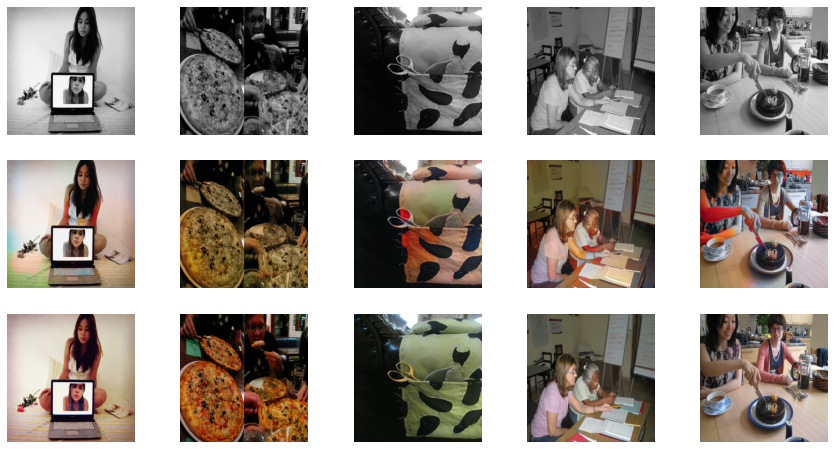


Epoch 1/100
Iteration 400/500
loss_D_fake: 0.53696
loss_D_real: 0.59626
loss_D: 0.56661
loss_G_GAN: 1.20021
loss_G_L1: 10.11337
loss_G: 11.31358


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


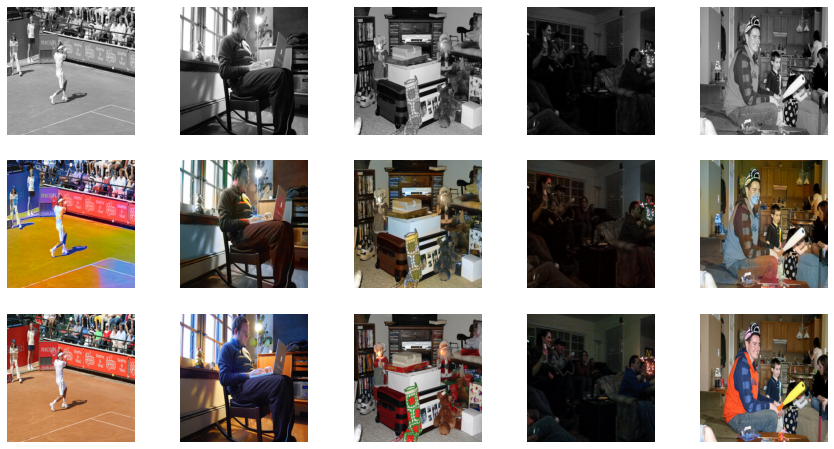

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 2/100
Iteration 200/500
loss_D_fake: 0.55314
loss_D_real: 0.61557
loss_D: 0.58436
loss_G_GAN: 1.18111
loss_G_L1: 10.18132
loss_G: 11.36242


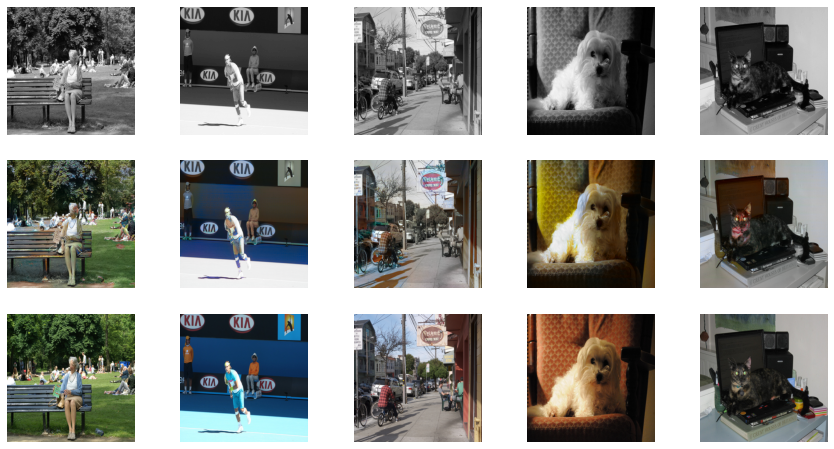


Epoch 2/100
Iteration 400/500
loss_D_fake: 0.53832
loss_D_real: 0.60371
loss_D: 0.57101
loss_G_GAN: 1.19737
loss_G_L1: 10.17070
loss_G: 11.36807


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 44 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


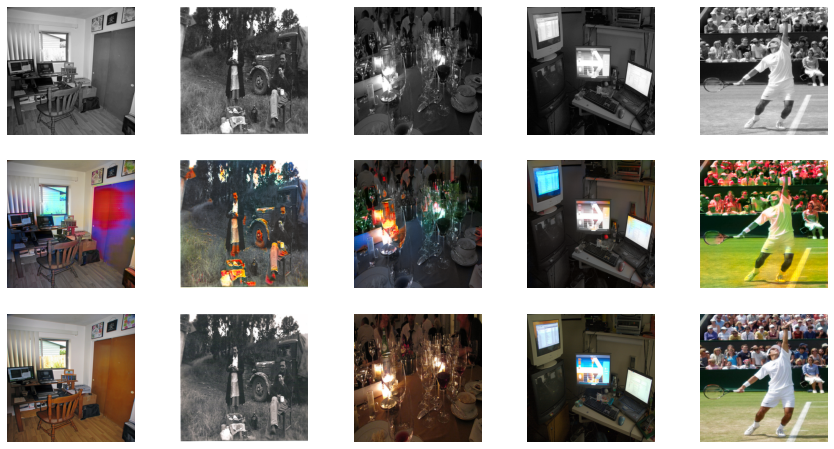

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 3/100
Iteration 200/500
loss_D_fake: 0.53286
loss_D_real: 0.59850
loss_D: 0.56568
loss_G_GAN: 1.18727
loss_G_L1: 10.05926
loss_G: 11.24652


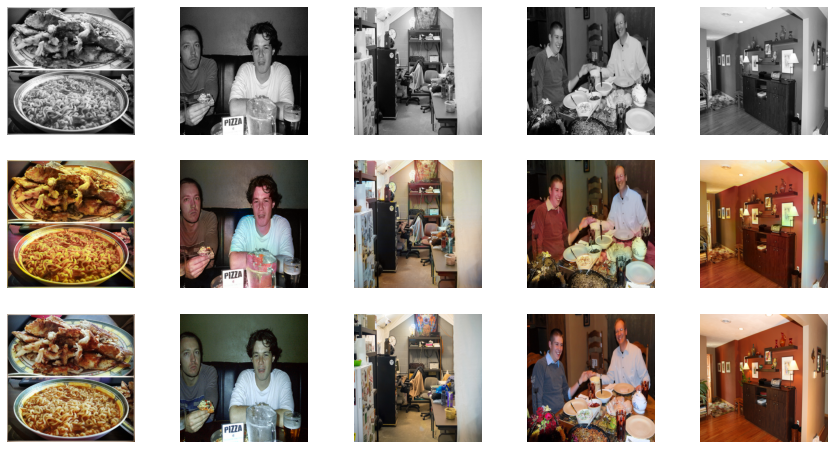


Epoch 3/100
Iteration 400/500
loss_D_fake: 0.53554
loss_D_real: 0.60340
loss_D: 0.56947
loss_G_GAN: 1.19298
loss_G_L1: 10.03882
loss_G: 11.23180


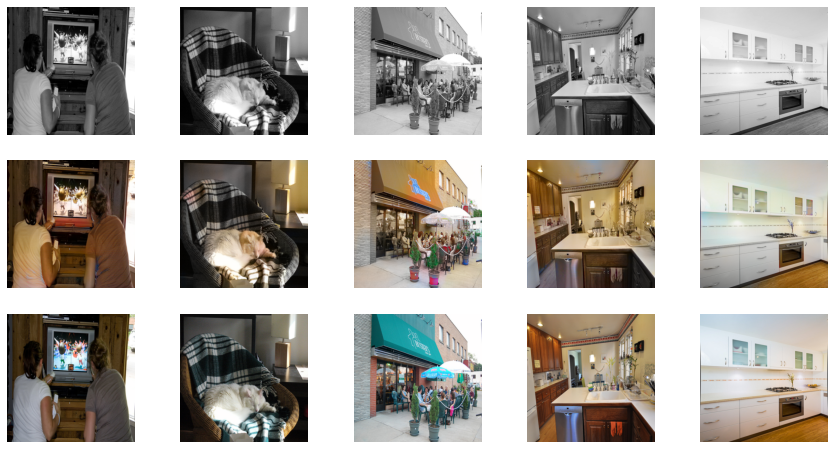

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 4/100
Iteration 200/500
loss_D_fake: 0.53791
loss_D_real: 0.59919
loss_D: 0.56855
loss_G_GAN: 1.17524
loss_G_L1: 9.97682
loss_G: 11.15207


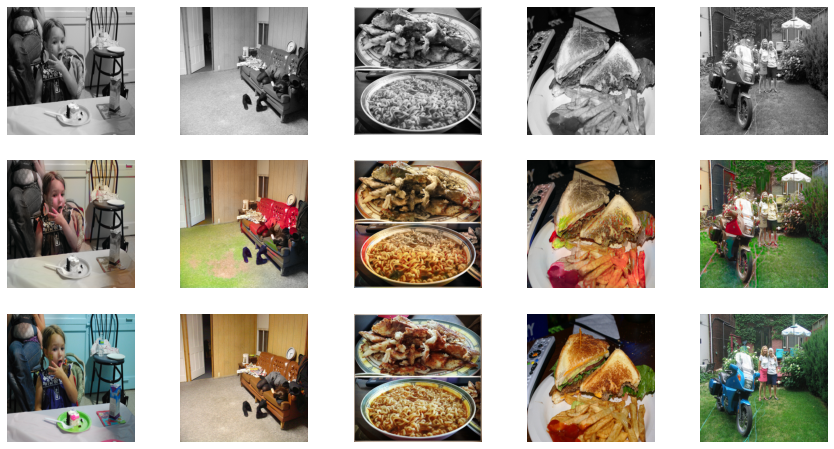


Epoch 4/100
Iteration 400/500
loss_D_fake: 0.53125
loss_D_real: 0.59721
loss_D: 0.56423
loss_G_GAN: 1.18046
loss_G_L1: 10.02010
loss_G: 11.20056


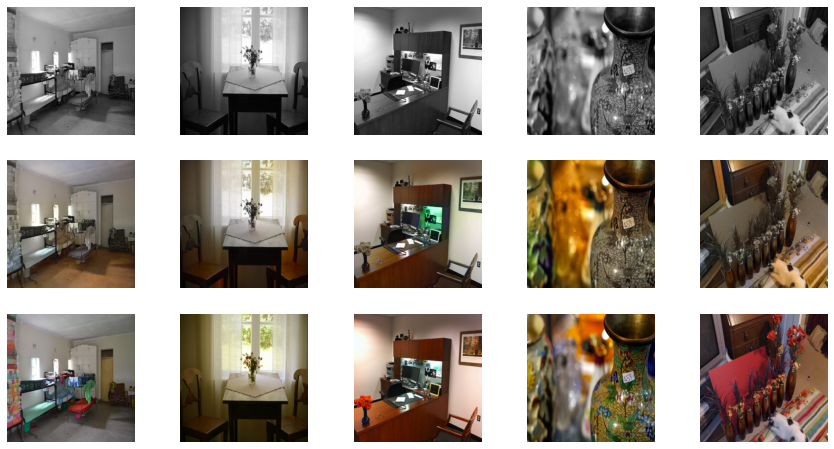

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 5/100
Iteration 200/500
loss_D_fake: 0.53620
loss_D_real: 0.61011
loss_D: 0.57316
loss_G_GAN: 1.20288
loss_G_L1: 10.06304
loss_G: 11.26591


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 237 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 406 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 100 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


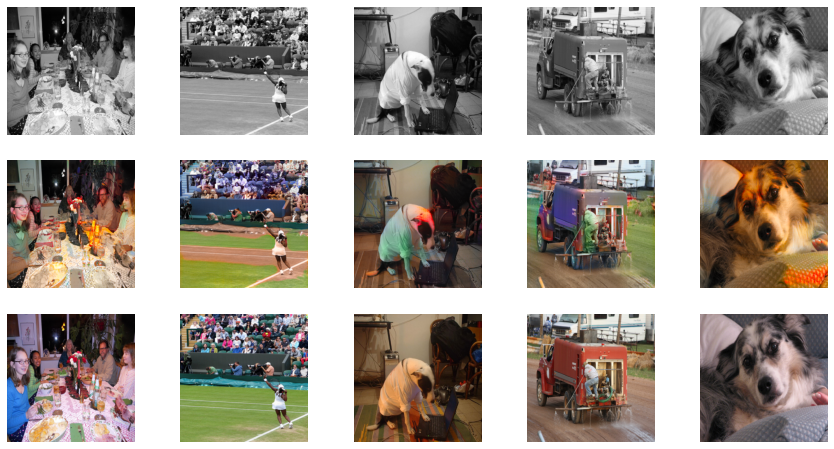


Epoch 5/100
Iteration 400/500
loss_D_fake: 0.54161
loss_D_real: 0.59714
loss_D: 0.56938
loss_G_GAN: 1.18270
loss_G_L1: 10.01288
loss_G: 11.19557


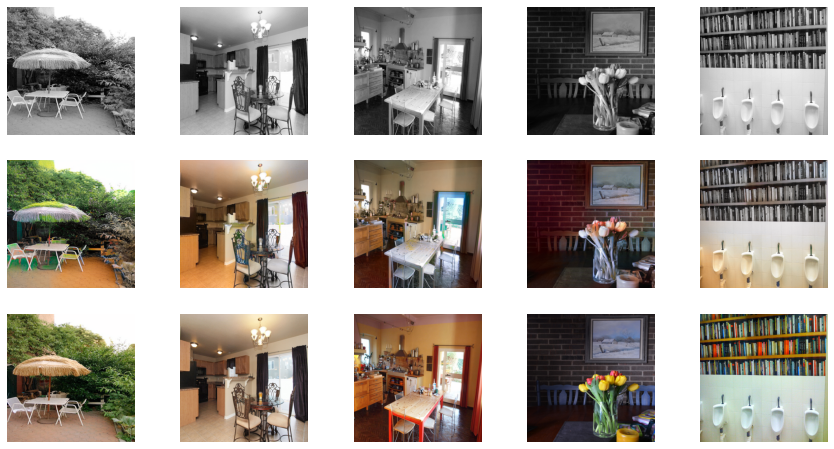

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 6/100
Iteration 200/500
loss_D_fake: 0.54346
loss_D_real: 0.59391
loss_D: 0.56868
loss_G_GAN: 1.19952
loss_G_L1: 9.95183
loss_G: 11.15135


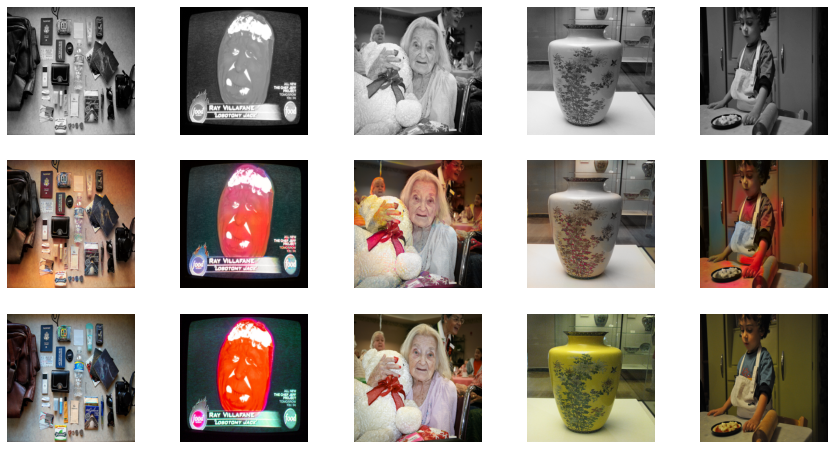


Epoch 6/100
Iteration 400/500
loss_D_fake: 0.53784
loss_D_real: 0.59727
loss_D: 0.56756
loss_G_GAN: 1.20062
loss_G_L1: 9.90751
loss_G: 11.10813


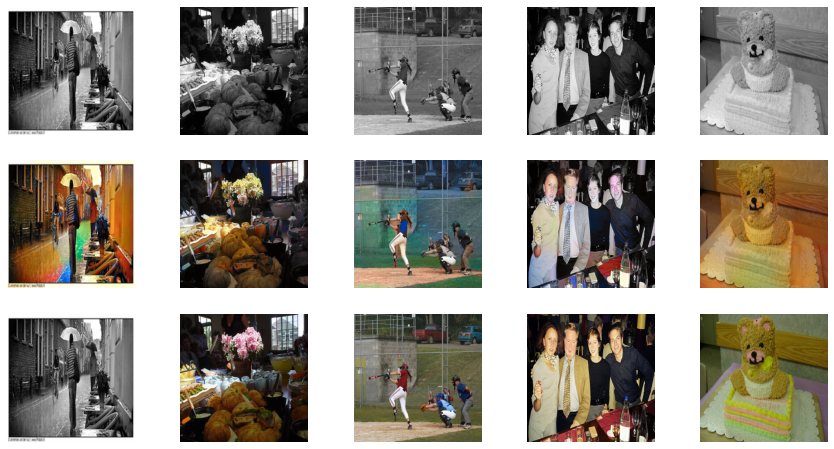

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 7/100
Iteration 200/500
loss_D_fake: 0.55649
loss_D_real: 0.60988
loss_D: 0.58319
loss_G_GAN: 1.16346
loss_G_L1: 9.98421
loss_G: 11.14767


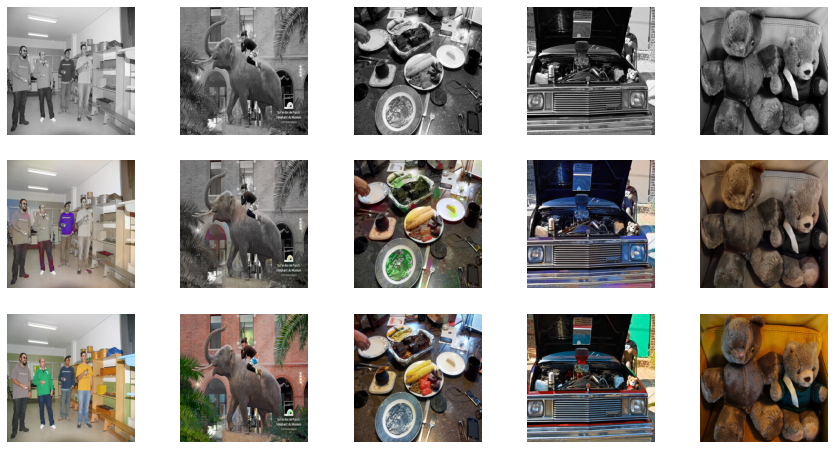


Epoch 7/100
Iteration 400/500
loss_D_fake: 0.54691
loss_D_real: 0.60276
loss_D: 0.57484
loss_G_GAN: 1.17080
loss_G_L1: 9.92869
loss_G: 11.09949


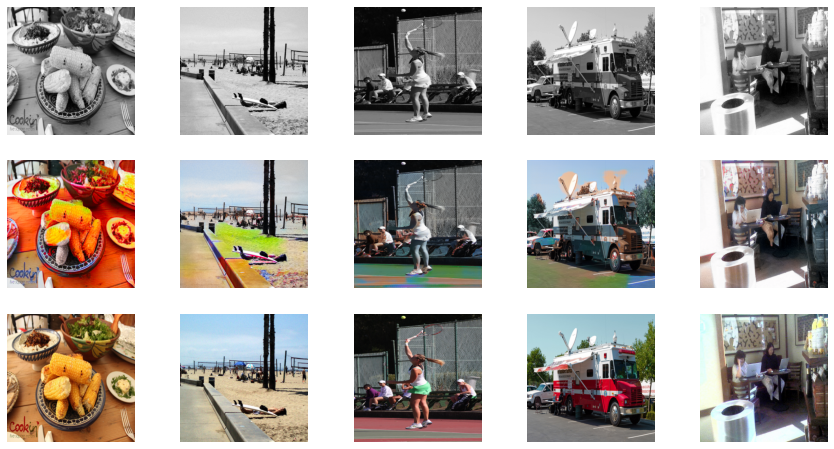

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 8/100
Iteration 200/500
loss_D_fake: 0.53913
loss_D_real: 0.60007
loss_D: 0.56960
loss_G_GAN: 1.15840
loss_G_L1: 9.83365
loss_G: 10.99205


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 10 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


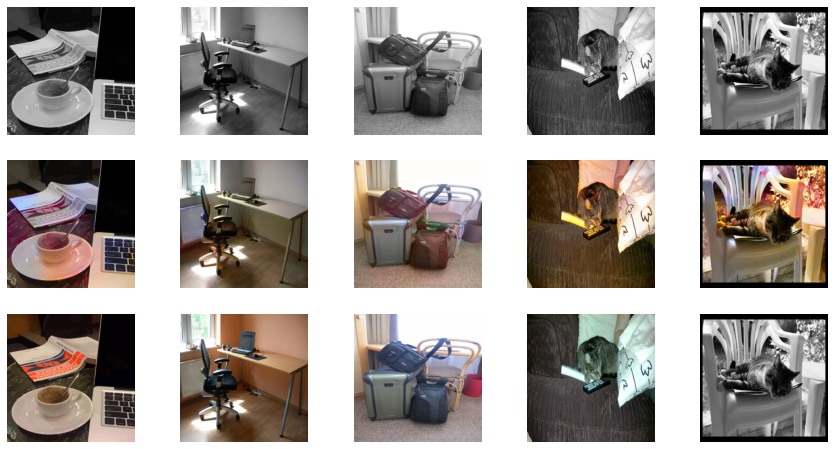


Epoch 8/100
Iteration 400/500
loss_D_fake: 0.53839
loss_D_real: 0.60457
loss_D: 0.57148
loss_G_GAN: 1.16831
loss_G_L1: 9.87239
loss_G: 11.04070


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 38 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


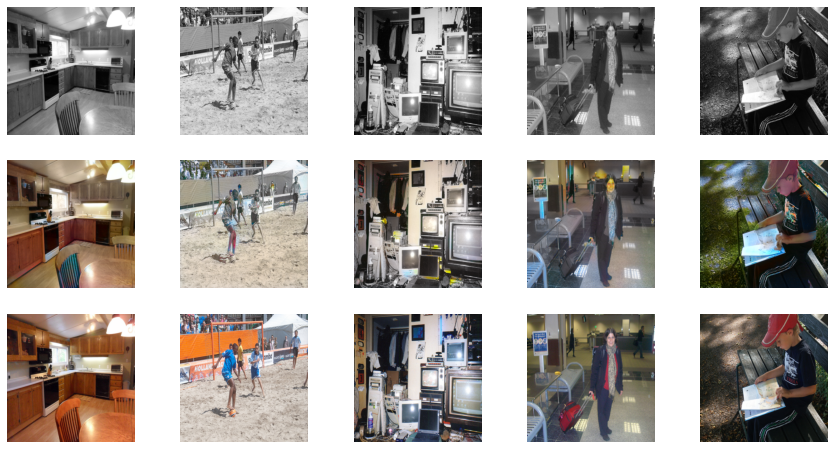

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 9/100
Iteration 200/500
loss_D_fake: 0.54024
loss_D_real: 0.59664
loss_D: 0.56844
loss_G_GAN: 1.15852
loss_G_L1: 9.75447
loss_G: 10.91298


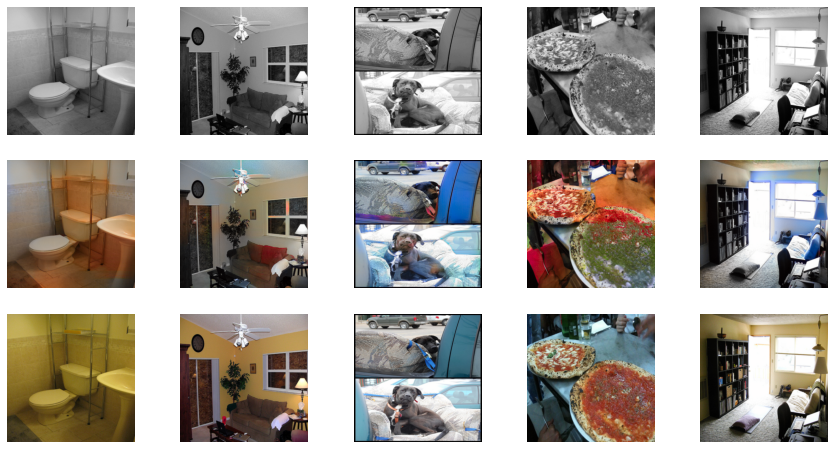


Epoch 9/100
Iteration 400/500
loss_D_fake: 0.54193
loss_D_real: 0.59820
loss_D: 0.57007
loss_G_GAN: 1.17242
loss_G_L1: 9.79098
loss_G: 10.96340


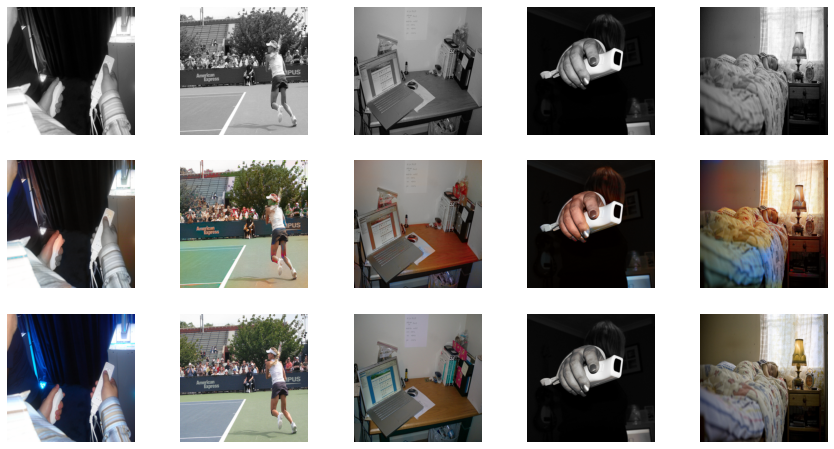

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 10/100
Iteration 200/500
loss_D_fake: 0.53384
loss_D_real: 0.60412
loss_D: 0.56898
loss_G_GAN: 1.17456
loss_G_L1: 9.87806
loss_G: 11.05262


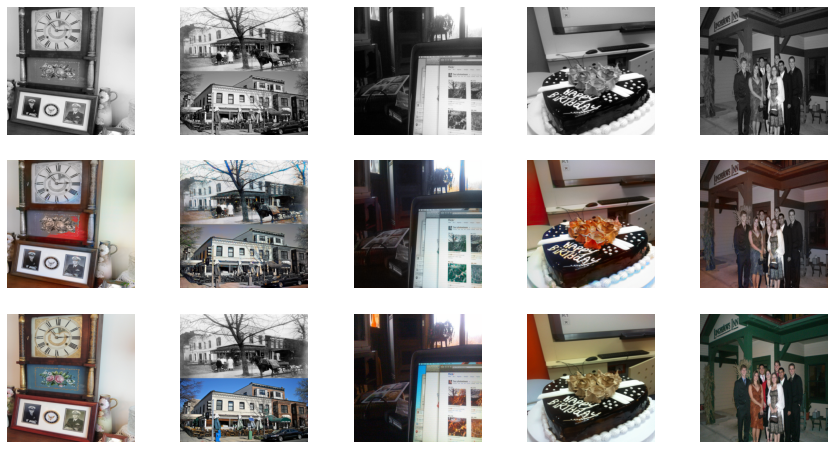


Epoch 10/100
Iteration 400/500
loss_D_fake: 0.53690
loss_D_real: 0.60312
loss_D: 0.57001
loss_G_GAN: 1.17520
loss_G_L1: 9.77094
loss_G: 10.94613


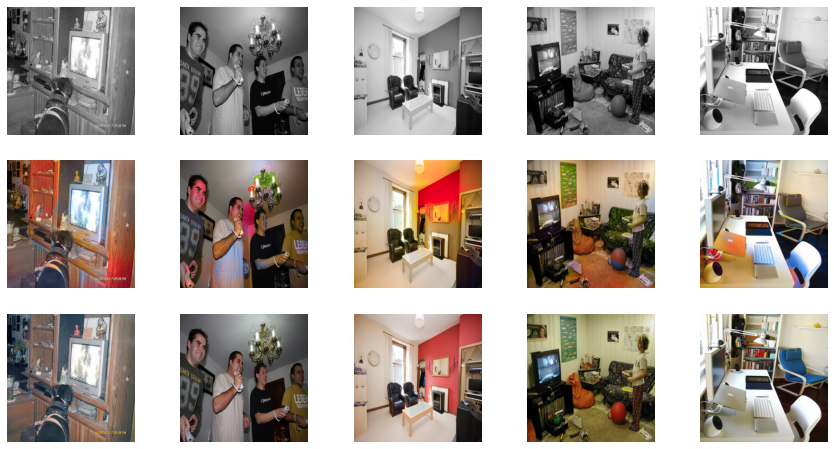

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 11/100
Iteration 200/500
loss_D_fake: 0.53530
loss_D_real: 0.58745
loss_D: 0.56138
loss_G_GAN: 1.19530
loss_G_L1: 9.72325
loss_G: 10.91856


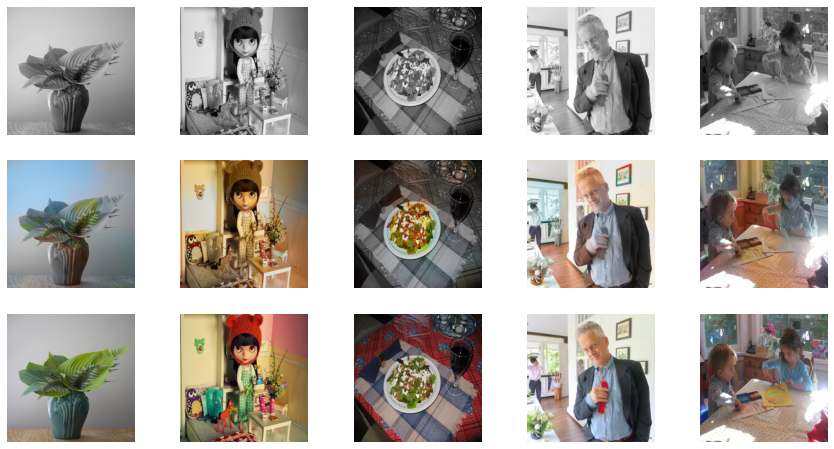


Epoch 11/100
Iteration 400/500
loss_D_fake: 0.53439
loss_D_real: 0.58897
loss_D: 0.56168
loss_G_GAN: 1.19227
loss_G_L1: 9.76909
loss_G: 10.96136


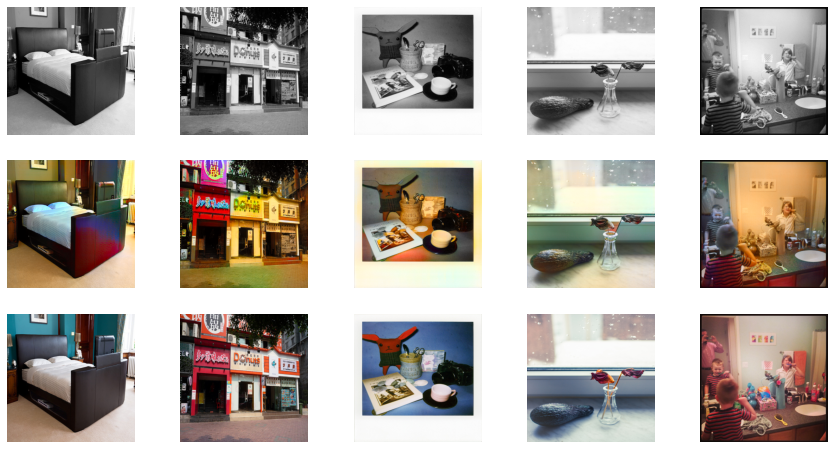

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 12/100
Iteration 200/500
loss_D_fake: 0.54159
loss_D_real: 0.61249
loss_D: 0.57704
loss_G_GAN: 1.17246
loss_G_L1: 9.66723
loss_G: 10.83969


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


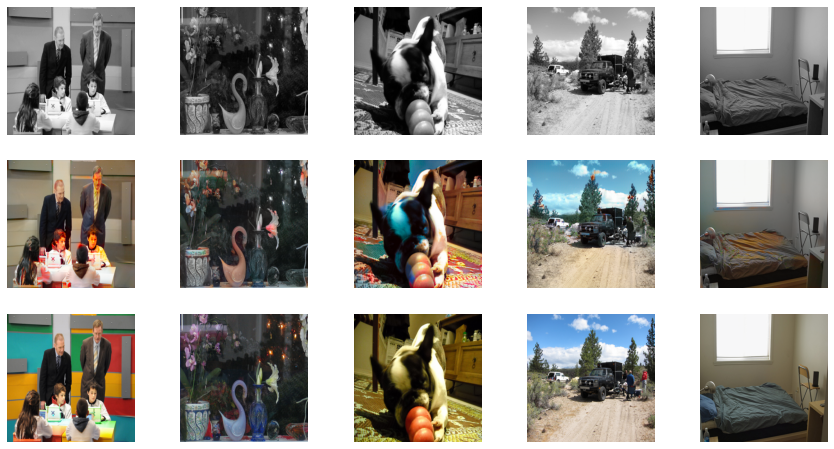


Epoch 12/100
Iteration 400/500
loss_D_fake: 0.53476
loss_D_real: 0.60546
loss_D: 0.57011
loss_G_GAN: 1.19144
loss_G_L1: 9.65981
loss_G: 10.85125


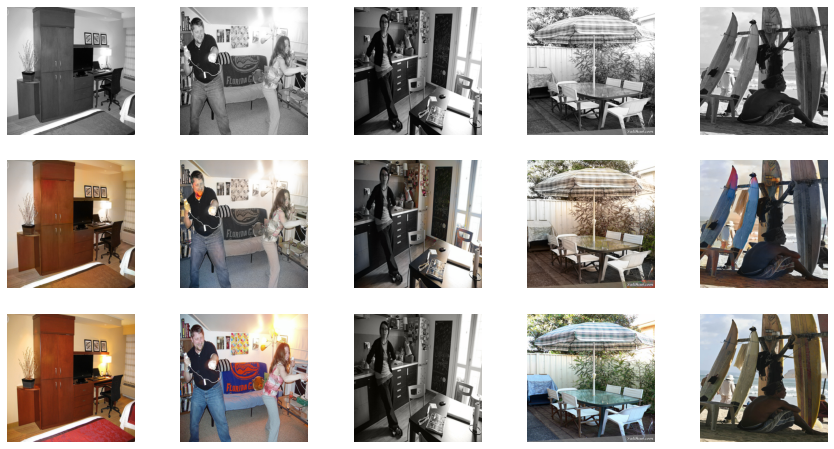

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 13/100
Iteration 200/500
loss_D_fake: 0.55333
loss_D_real: 0.61993
loss_D: 0.58663
loss_G_GAN: 1.17827
loss_G_L1: 9.65890
loss_G: 10.83717


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 22 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 14 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


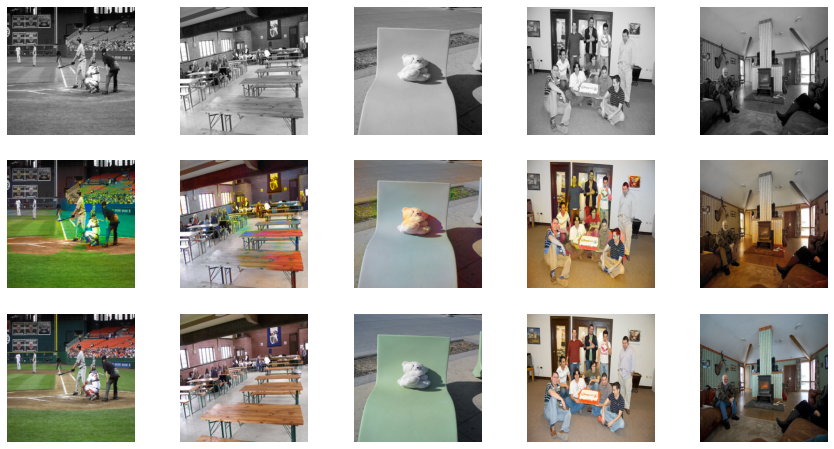

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

path_g = "/content/gdrive/MyDrive/weights/generator.pt"
path_d = "/content/gdrive/MyDrive/weights/discriminator.pt"
path_go = "/content/gdrive/MyDrive/weights/generator_optimizer.pt"
path_do = "/content/gdrive/MyDrive/weights/discriminator_optimizer.pt"
path_losses = '/content/gdrive/MyDrive/weights/losses.txt'

model = MainModel()
train_model(model, train_dataloader, 100, path_g, path_d, path_go, path_do, path_losses)

#TEST

Now we are going to test the previously trained generator performances. We are going to use Mean Absolute Error and Pixel Accuracy metrics. We define them and then we are going to test the model on the Test Set.

## Metrics definition

We are going to define the functions for calculating the Mean Absolute Error and Pixel Accuracy

In [ ]:
'''
@param real_image is the real image in the  L*a*b space 
@param fake_image is the image generated in the L*a*b space
@return the MeanAbsoluteError between the fake and real image
'''
def MeanAbsoluteErrorImage(real_image, fake_image ):
  diff_a = torch.abs(real_image[1,...] - fake_image[1,...])
  sum_a = torch.sum(diff_a).item()
  mae_a = sum_a / (real_image.shape[1] ** 2) 
  del(diff_a)
  del(sum_a)

  diff_b = torch.abs(real_image[2,...] - fake_image[2,...])
  sum_b = torch.sum(diff_b).item()
  mae_b = sum_b / (real_image.shape[1] ** 2) 
  del(diff_b)
  del(sum_b)

  return (mae_a + mae_b) / 2

In [ ]:
real_image = torch.ones((3,256,256))
fake_image = torch.zeros((3,256,256))
mae = MeanAbsoluteErrorImage(real_image, fake_image)
print(mae)

1.0


In [ ]:
'''
@param real_images_batch is the real images batch in the  L*a*b space 
@param fake_images_batch is the batch of generated images in the L*a*b space
@return the MeanAbsoluteError between the fake and real image
'''
def MeanAbsoluteErrorBatch(real_image_batch, fake_image_batch ):
  maeBatch = 0
  i = 0
  for image in real_image_batch:
    maeImage = MeanAbsoluteErrorImage(image, fake_image_batch[i])
    maeBatch += maeImage
    i+=1
  return maeBatch / (i)

In [ ]:
real_image = torch.ones((16,3,256,256))
fake_image = torch.zeros((16,3,256,256))
mae = MeanAbsoluteErrorBatch(real_image, fake_image)
print(mae)

1.0


In [ ]:
real_images_batch = torch.ones((16,3,256,256))
fake_images_batch = torch.zeros((16,3,256,256))

real_image = torch.ones((3,256,256))
fake_image = torch.ones((3,256,256))
diff_L = torch.abs(real_image[0,...] - fake_image[0,...])
pred_L = (torch.le(diff_L, 1 * 0.5)).float()
sum_L = torch.sum(pred_L).item()
print(sum_L)
diff_a = torch.abs(real_image[1,...] - fake_image[1,...])
pred_a = (torch.le(diff_a, 1 * 0.5)).float()
sum_a = torch.sum(pred_a).item()

diff_b = torch.abs(real_image[2,...] - fake_image[2,...])
pred_b = (torch.le(diff_b, 1 * 0.5)).float()
sum_b = torch.sum(pred_b).item()

accuracy = (sum_L + sum_a + sum_b) / ((real_image.shape[1] ** 2)*3)
print(accuracy)

65536.0
1.0


In [ ]:
'''
@param real_image is the real image in the  L*a*b space 
@param fake_image is the image generated in the L*a*b space
@param threshold is the value under which two pixels have the same value
@return the pixel accuracy between the fake and real image
'''
def pixelAccuracyImages(real_image, fake_image, threshold):

  diff_a = torch.abs(real_image[1,...] - fake_image[1,...])
  pred_a = (torch.le(diff_a, 2.2 * threshold)).float()
  sum_a = torch.sum(pred_a).item()
  acc_a = sum_a / (real_image.shape[1] ** 2) 

  diff_b = torch.abs(real_image[2,...] - fake_image[2,...])
  pred_b = (torch.le(diff_b, 2.2 * threshold)).float()
  sum_b = torch.sum(pred_b).item()
  acc_b = sum_b / (real_image.shape[1] ** 2) 

  return (acc_a + acc_b) / 2


In [ ]:
'''
@param real_image_batch batch of real images in the  L*a*b space 
@param fake_image_batch batch of images generated in the L*a*b space
@param threshold is the value under which two pixels have the same value
@return the pixel accuracy between the fake and real image in the batch
'''
def pixelAccuracyBatch(real_image_batch, fake_image_batch, threshold):
  pixelAccuracyBatch = 0
  i = 0
  for image in real_image_batch:
    accImage = pixelAccuracyImages(image, fake_image_batch[i], threshold)
    pixelAccuracyBatch =  pixelAccuracyBatch + accImage
    i+=1
  return pixelAccuracyBatch / (i)

In [ ]:
'''
@param generator model that must be tested
@param test_dataloader dataloader of the testsamples 
@return mae and pixel_accuracy of the model
'''
def evaluateModel(generator, test_dataloader):
  mae = 0;
  acc = 0;
  batch = 0;
  for sample in test_dataloader:
    print(batch)
    sample_L = sample['L']
    #sample_L.cuda()
    sample_ab = sample['ab']

    gen_ab = generator.forward(sample_L)
    gen_ab.cpu()

    real_images = torch.cat([sample_L, sample_ab], dim=1)
    fake_images = torch.cat([sample_L, gen_ab], dim=1)

    acc += pixelAccuracyBatch(real_images, fake_images, 0.05)
    mae += MeanAbsoluteErrorBatch(real_images,fake_images)
    del(sample_L)
    del(sample_ab)
    del(gen_ab)
    del(real_images)
    del(fake_images)
    del(sample)
    gc.collect()

    batch += 1
  return mae/ len(test_dataloader), acc / len(test_dataloader)

## TEST EXECUTION

Now we are going to actually evaluate the generator. Before doing it we load the model weights from Google Drive.


In [ ]:
from google.colab import drive
import gc
drive.mount('/content/gdrive')
generator_path = "/content/gdrive/MyDrive/weights/generator.pt"

gc.enable()
generator = Unet()
generator.eval()
generator.load_state_dict(torch.load(generator_path, map_location=torch.device('cpu')))



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


<All keys matched successfully>

In [ ]:
mae, acc = evaluateModel(generator, test_dataloader)
print("Mean Absolute Error: "+str(mae))
print("Pixel Accuracy: "+str(acc))

0


KeyboardInterrupt: ignored

## TEST IMAGES VISUALIZATION

Leaving the numbers aside, let's look how some of the test images are actually colored. 


In [ ]:
'''
@param generator model that must be tested
@param test_dataloader dataloader of the test samples 
'''
def visualizeTestImages(generator, test_dataloader):
  for sample in test_dataloader:
    sample_L = sample['L']
    #sample_L.cuda()
    sample_ab = sample['ab']

    with torch.no_grad():
        gen_ab = generator.forward(sample_L)
        gen_ab.cpu()

    fake_imgs = lab_to_rgb(sample_L, gen_ab)
    real_imgs = lab_to_rgb(sample_L, sample_ab)
    fig = plt.figure(figsize=(15, 8))
    print("First row : grayscale images, Second row : colored images, Third row : real images")
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(sample_L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()

    del(sample_L)
    del(sample_ab)
    del(gen_ab)
    del(real_imgs)
    del(fake_imgs)
    del(sample)
    gc.collect()

First row : grayscale image, Second row : colored image, Third row : real image


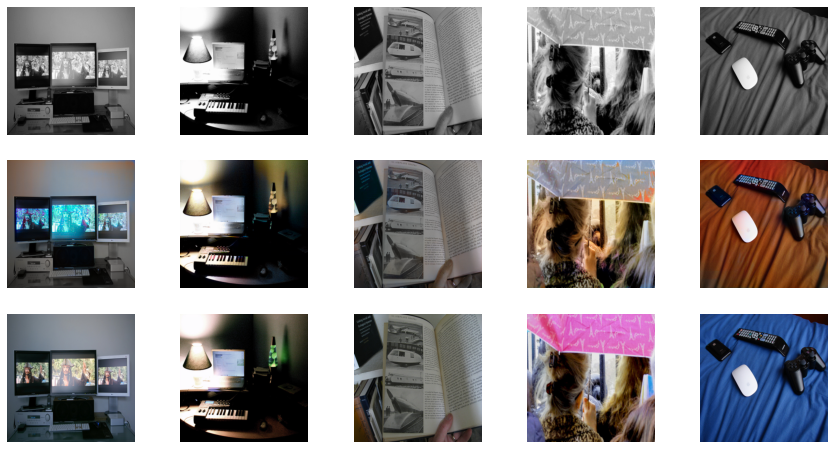

First row : grayscale image, Second row : colored image, Third row : real image


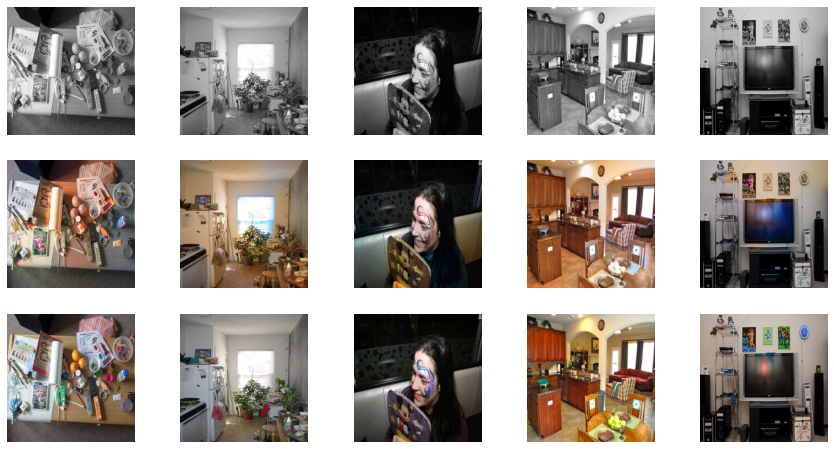

KeyboardInterrupt: ignored

In [ ]:
visualizeTestImages(generator, test_dataloader)